# Sentinel-2 Satellite Image Analysis with Python

In [1]:
from glob import glob
import os

import earthpy as et
import earthpy.spatial as es
import earthpy.plot as ep

import rasterio as rio

import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import ListedColormap

import plotly.graph_objects as go

### Read Sentinel-2 data:

The data consists of 12 bands which according to their website is as follows:

<img src="Images/Sentinel2_Band_details.png">

It should be noted that the band 8A is already contained in band 8. Band 8A is a slice of infra-red that is used for very specific applications (like soil characterization) that you want to eliminate the "noise" of near infra-red. It can be used for ecology (vegetation index) and it is recommended to use the entire band 8. This can be tweaked for specific purposses/applications.

“a TCI (True Colour Image) in JPEG2000 format is included within the Tile folder of Level-1C products in this format(1). The TCI is an RGB image built from the B02 (Blue), B03 (Green), and B04 (Red) Bands. The reflectances are coded between 1 and 255, 0 being reserved for 'No Data'.”
https://sentinel.esa.int/web/sentinel/user-guides/sentinel-2-msi/definitions

TCI gives a quick preview of the satellite image in true color thereby being of low data size.

In [2]:
os.chdir("Sentinel_Images/")

In [3]:
# s2_sentinel_bands = glob("Sentinel_Images/*B*.jp2")
s2_sentinel_bands = glob("*B*.jp2")

In [4]:
s2_sentinel_bands.sort()

In [5]:
s2_sentinel_bands

['T45RXL_20210208T043939_B01_60m.jp2',
 'T45RXL_20210208T043939_B02_60m.jp2',
 'T45RXL_20210208T043939_B03_60m.jp2',
 'T45RXL_20210208T043939_B04_60m.jp2',
 'T45RXL_20210208T043939_B05_60m.jp2',
 'T45RXL_20210208T043939_B06_60m.jp2',
 'T45RXL_20210208T043939_B07_60m.jp2',
 'T45RXL_20210208T043939_B09_60m.jp2',
 'T45RXL_20210208T043939_B11_60m.jp2',
 'T45RXL_20210208T043939_B12_60m.jp2',
 'T45RXL_20210208T043939_B8A_60m.jp2']

### NOTE: band 10 is unavailable for this resolution of 60 meters.

In [43]:
src = rio.open("T45RXL_20210208T043939_B02_60m.jp2")

In [44]:
type(src)

rasterio.io.DatasetReader

In [47]:
from rasterio.plot import show

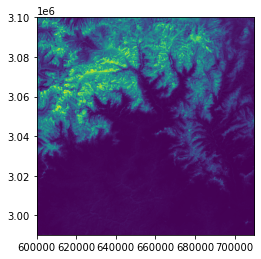

<AxesSubplot:>

In [48]:
show(src)

In [5]:
# Python3 list to contain all 11 bands-
stacked_s2_sentinel = []

In [6]:
for img in s2_sentinel_bands:
    with rio.open(img, 'r') as f:
        stacked_s2_sentinel.append(f.read(1))

In [7]:
# Sanity check-
len(stacked_s2_sentinel)

11

In [5]:
'''
# Python list to contain bands of file for further analysis-
stacked_s2_sentinel = []

for img in s2_sentinel_bands:
    if img[-7:] == 'TCI.jp2' or img[-7:] == 'B8A.jp2':
        continue
    else:
        with rio.open(img, 'r') as f:
            stacked_s2_sentinel.append(f.read(1))


# Sanity check- 12 bands are read in-
len(stacked_s2_sentinel)
'''

In [9]:
# Stack the 11 individual bands into an n-d array-
stacked_s2_sentinel_img = np.stack(stacked_s2_sentinel)

In [10]:
stacked_s2_sentinel_img.shape

(11, 1830, 1830)

### NOTE:
'matplotlib' can only plot 8-bit images between the values of 0 - 255 or floating point values between 0 - 1.
Try dividing the Sentinel 2 data by 10000 before plotting it.

Try normalizing the data using the formula:
$z_i = \frac{x_i - min\left(x\right)}{max\left(x\right) - min\left(x\right)}$

In [31]:
stacked_s2_sentinel_img_divided = stacked_s2_sentinel_img / 10000

In [32]:
stacked_s2_sentinel_img_divided.shape

(11, 1830, 1830)

In [33]:
stacked_s2_sentinel_img.min(), stacked_s2_sentinel_img.max()

(0, 18157)

In [34]:
stacked_s2_sentinel_img_divided.min(), stacked_s2_sentinel_img_divided.max()

(0.0, 1.8157)

In [37]:
# Normalize image-
normalized_img = (stacked_s2_sentinel_img - stacked_s2_sentinel_img.min()) / (stacked_s2_sentinel_img.max() - stacked_s2_sentinel_img.min())

In [38]:
normalized_img.min(), normalized_img.max()

(0.0, 1.0)

### Visualize Bands:

The data contains 11 bands.

In [9]:
titles = [f'band-{i}' for i in range(1, 13)]

In [10]:
titles.remove('band-10')

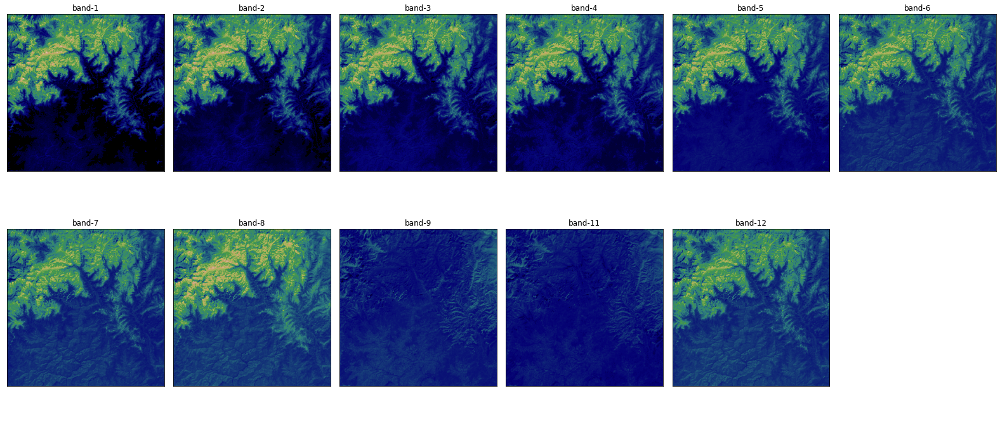

In [15]:
# Visualize each of the 11 bands-
ep.plot_bands(
    arr = stacked_s2_sentinel_img, cmap = 'gist_earth',
    figsize = (22, 10), cols = 6,
    cbar = False, title = titles,
    vmin = 0, vmax = 18157)

plt.show()

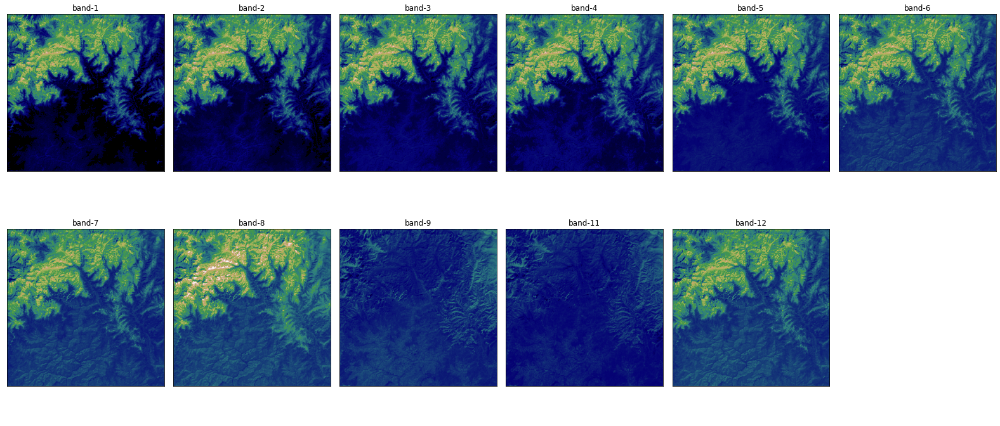

In [35]:
# Visualize each of the 11 bands-
ep.plot_bands(
    arr = stacked_s2_sentinel_img_divided, cmap = 'gist_earth',
    figsize = (22, 10), cols = 6,
    cbar = False, title = titles)

plt.show()

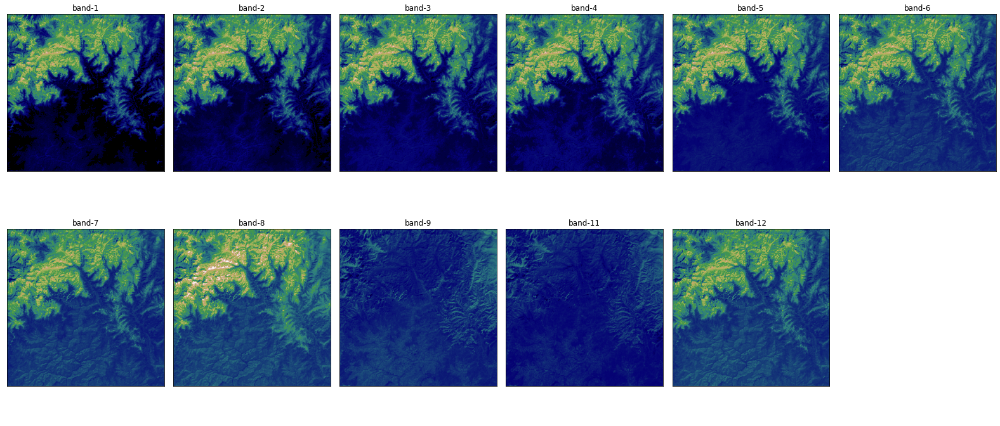

In [39]:
# Visualize each of the 11 bands using normalized image-
ep.plot_bands(
    arr = normalized_img, cmap = 'gist_earth',
    figsize = (22, 10), cols = 6,
    cbar = False, title = titles)

plt.show()

### RGB Composite Image:

The downloaded data has multiple bands containing data ranging from visible spectrum to infrared. To effectively visualize this data, it is necessary to create an RGB Composite image.

To plot RGB composite images, you will plot the red, green and blue bands, which are bands 4, 3 and 2, respectively. The indices for red band = 3, green band = 2 and blue band = 1.

### Suggestion:

What I've done in the past with plotting images using matplotlib is read them in as numpy arrays, then use the numpy nanpercentile function to determine contrast stretch bounds, then use those bounds with the numpy interp function to dynamically stretch the image between 0 and 1 using those bounds. As an example using the blue band and a 1% to 99% contrast stretch:

blue_min, blue_max = np.nanpercentile(blue_arr, 1.0, 99.0)
blue_stretch = np.interp(blue_arr, (blue_min, blue_max), (0,1))


Then you repeat for green and red, stack the arrays, and output using Matplotlib.

Not sure if this suits your purposes, or if you don't want to use a dynamic stretch, but that would be my suggestion.

Blue = Band-2
Green = Band-3
Red = Band-4

In [12]:
s2_sentinel_bands

['T45RXL_20210208T043939_B01_60m.jp2',
 'T45RXL_20210208T043939_B02_60m.jp2',
 'T45RXL_20210208T043939_B03_60m.jp2',
 'T45RXL_20210208T043939_B04_60m.jp2',
 'T45RXL_20210208T043939_B05_60m.jp2',
 'T45RXL_20210208T043939_B06_60m.jp2',
 'T45RXL_20210208T043939_B07_60m.jp2',
 'T45RXL_20210208T043939_B09_60m.jp2',
 'T45RXL_20210208T043939_B11_60m.jp2',
 'T45RXL_20210208T043939_B12_60m.jp2',
 'T45RXL_20210208T043939_B8A_60m.jp2']

In [19]:
stacked_s2_sentinel_img[1:, :, :].dtype

dtype('uint16')

### Use _np.nanpercentile()_ to determine contrast stretch bounds:

In [24]:
blue_min = np.nanpercentile(stacked_s2_sentinel_img[1, :, :], 1)
blue_max = np.nanpercentile(stacked_s2_sentinel_img[1:, :, :], 99)

In [26]:
green_min = np.nanpercentile(stacked_s2_sentinel_img[2,:, :], 1)
green_max = np.nanpercentile(stacked_s2_sentinel_img[2, :, :], 99)

In [27]:
red_min = np.nanpercentile(stacked_s2_sentinel_img[3, :, :], 1)
red_max = np.nanpercentile(stacked_s2_sentinel_img[3, :, :], 99)

In [28]:
print(f"Contrast stretch min blue = {blue_min} and max blue = {blue_max}")
print(f"Contrast stretch min green = {green_min} and max green = {green_max}")
print(f"Contrast stretch min red = {red_min} and red blue = {red_max}")

Contrast stretch min blue = 8.0 and max blue = 13047.0
Contrast stretch min green = 86.0 and max green = 13685.0
Contrast stretch min red = 97.0 and red blue = 13211.0


### Use calculated contrast stretch bounds with _np.interp()_ function to dynamically stretch the image between 0 and 1 using those bounds:

In [29]:
blue_stretch = np.interp(stacked_s2_sentinel_img[1, :, :], (blue_min, blue_max), (0, 1))

In [30]:
green_stretch = np.interp(stacked_s2_sentinel_img[2, :, :], (green_min, green_max), (0, 1))

In [32]:
red_stretch = np.interp(stacked_s2_sentinel_img[3, :, :], (red_min, red_max), (0, 1))

In [36]:
blue_stretch.shape, green_stretch.shape, red_stretch.shape

((1830, 1830), (1830, 1830), (1830, 1830))

In [37]:
rgb_img = np.stack([red_stretch, green_stretch, blue_stretch])

In [38]:
rgb_img.shape

(3, 1830, 1830)

In [39]:
rgb_img = rgb_img.reshape(1830, 1830, 3)
rgb_img.shape

(1830, 1830, 3)

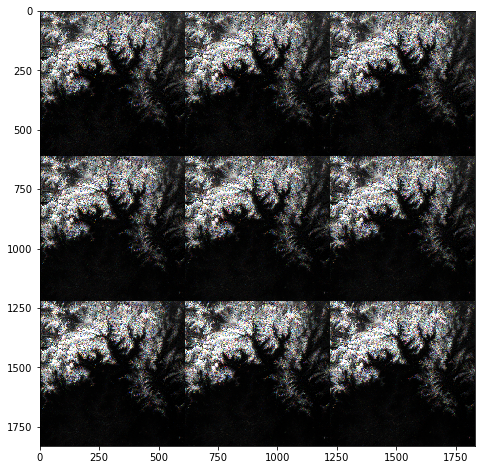

In [43]:
plt.figure(figsize = (10, 8))

# plt.imshow(rgb_img)
plt.imshow(rgb_img, interpolation='nearest')

plt.show()

In [41]:
from PIL import Image

In [42]:
img = Image.fromarray(rgb_img, 'RGB')
# img.save('my.png')
img.show()

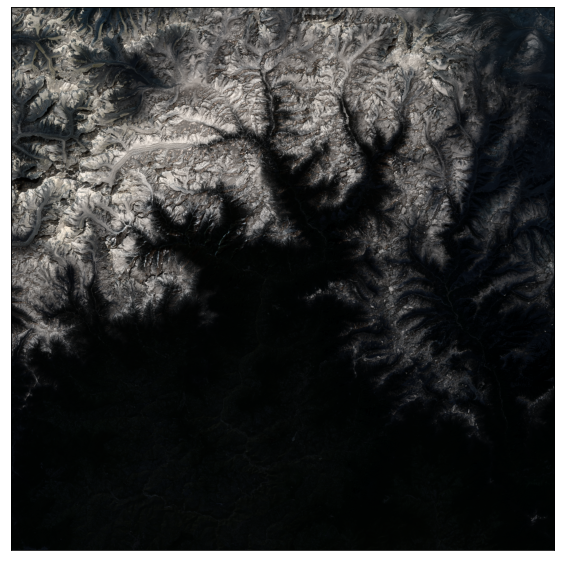

In [16]:
# Plot RGB composite image-
'''
Arguments:

arr : numpy array
    An n-dimensional array in rasterio band order (bands, rows, columns)
    containing the layers to plot.

rgb : list (default = (0, 1, 2))
    Indices of the three bands to be plotted.
'''
rgb = ep.plot_rgb(
    arr = stacked_s2_sentinel_img, rgb = (1, 2, 3),
    figsize =(20, 10) #, title = titles
)

plt.show()

In [22]:
# Create a numpy array copy-
sentinel_img = np.copy(stacked_s2_sentinel_img)

In [24]:
sentinel_img[sentinel_img > 3000] = 3000

In [25]:
sentinel_img = sentinel_img / 3000

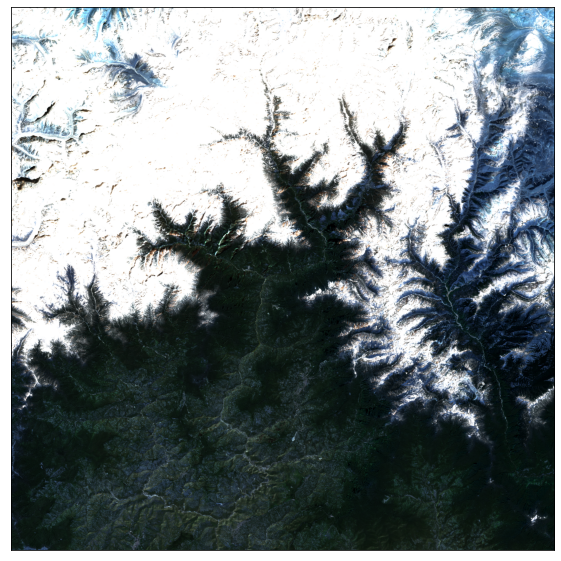

In [40]:
rgb = ep.plot_rgb(
    arr = sentinel_img, rgb = (1, 2, 3),
    figsize =(20, 10)
)

plt.show()

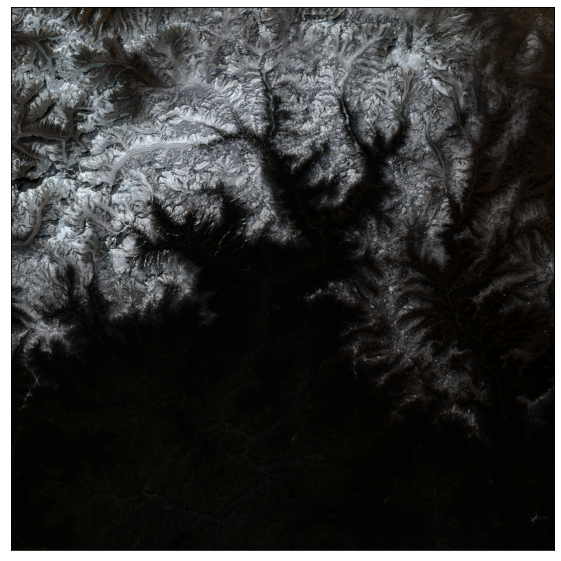

In [41]:
rgb = ep.plot_rgb(
    arr = normalized_img, rgb = (3, 2, 1),
    figsize =(20, 10) #, title = titles
)

plt.show()

### RGB Composite image using stretch:

It can happen that the created RGB Composite image can be dark due to skewness in pixel brightness towards 0 values. To alleviate this problem, the pixel brightness values in the image can be stretched with the help of 'stretch = True' parameter. This will extra-polate the pixel brightness values to the entire range of 0-255 values in an attempt to increase the contrast of the image.

'str_clip' parameter will specify the amount of tails of data to be clipped.

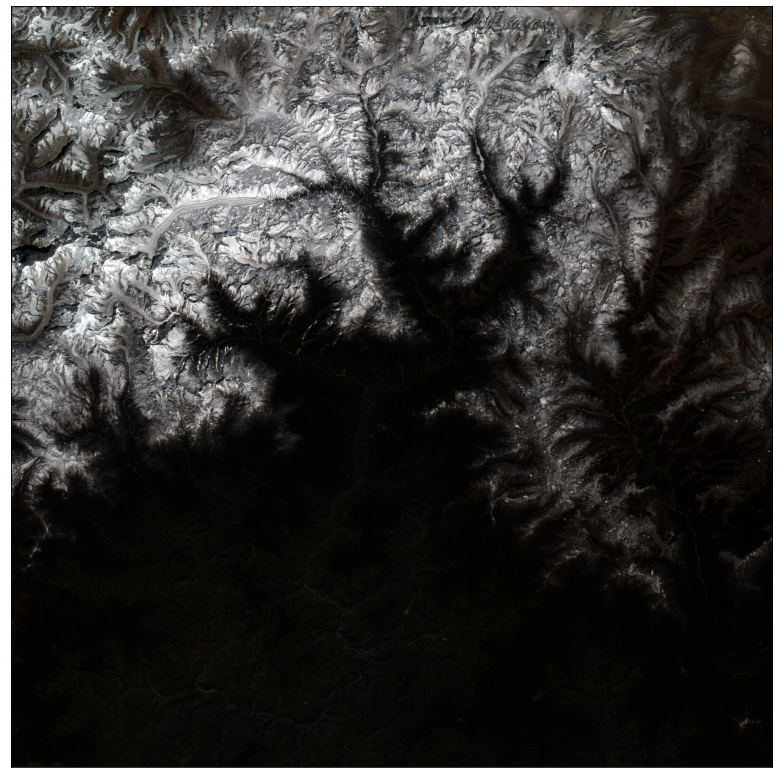

In [26]:
# RGB composite image with stretch-
rgb_stretch = ep.plot_rgb(
        arr = stacked_s2_sentinel_img, rgb = (3, 2, 1),
        stretch = True, str_clip = 0.2,
        figsize =(20, 14)
        )

plt.show()

### Histograms:

Visualizing the distribution of pixel values within the different bands can be helpful in further analysis.

In [27]:
colors = ['tomato', 'navy', 'MediumSpringGreen', 'lightblue', 'orange',
        'blue', 'maroon', 'purple', 'yellow', 'olive', 'brown', 'cyan']

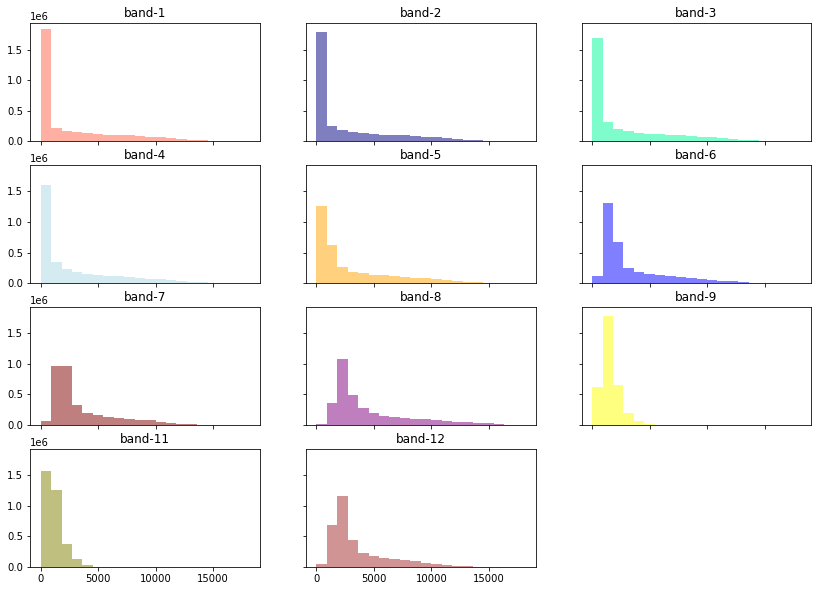

In [30]:
ep.hist(
        arr = stacked_s2_sentinel_img, colors = colors,
        title = titles, cols = 3,
        alpha = 0.5, figsize = (14, 10)
        )

plt.show()

### Normalized Difference Vegetation Index (NDVI)

To figure out green vegetation within an image, specific wavelengths of visible and Near-Infrared (NIR) reflected by the plants are to be analysed.
NDVI computes this desired vegetation as the difference between NIR (strongly reflected by vegetation) and red light (absorbed by vegetation).

$NDVI \in \left(-1, +1\right)$

$NDVI = \frac{NIR - Red}{NIR + Red}$

For negative values, it's probably water. Whereas, for values close to +1, it’s probably dense green leaves. While, values close to zero might indicate  an urbanized area which doesn't have much green leaves.

In [45]:
ndvi = es.normalized_diff(stacked_s2_sentinel_img[10], stacked_s2_sentinel_img[3])
# ndvi = es.normalized_diff(arr_st[7], arr_st[3])

In [46]:
ndvi.min(), ndvi.max()

(0.0, 16383.5)

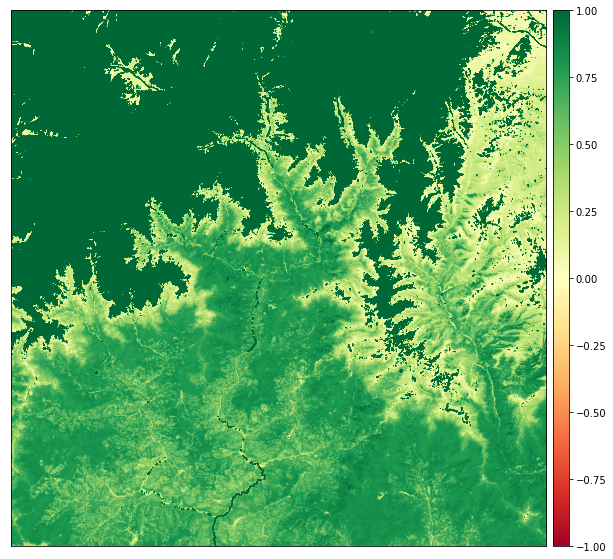

In [47]:
ep.plot_bands(
    arr = ndvi, cmap = "RdYlGn",
    cols = 1, vmin = -1, vmax = 1,
    figsize = (10, 14)
)

plt.show()

### Soil Adjusted Vegetation Index (SAVI):

SAVI is a vegetation index that attempts to minimize soil brightness influences using a soil-brightness correction factor. This is often used in arid regions where vegetative cover is low.

$SAVI = \frac{NIR - Red}{NIR + Red + L} \times (1 + L)$

The value of _L_ depends on the geographic location's amount of vegetation. Usually:

- for areas having no green vegetation cover, L = 1
- for areas of moderate green vegetation cover, L = 0.5
- for areas of high vegetation cover, L = 0 (this is equivalent to NDVI method of above)

$SAVI \in \left(-1.0, +1.0\right)$

In [51]:
L = 0.4

savi = ((stacked_s2_sentinel_img[10] - stacked_s2_sentinel_img[3]) / (stacked_s2_sentinel_img[10] + stacked_s2_sentinel_img[3] + L)) * (1 + L)

In [52]:
savi.min(), savi.max()

(0.0, 20851.72727272727)

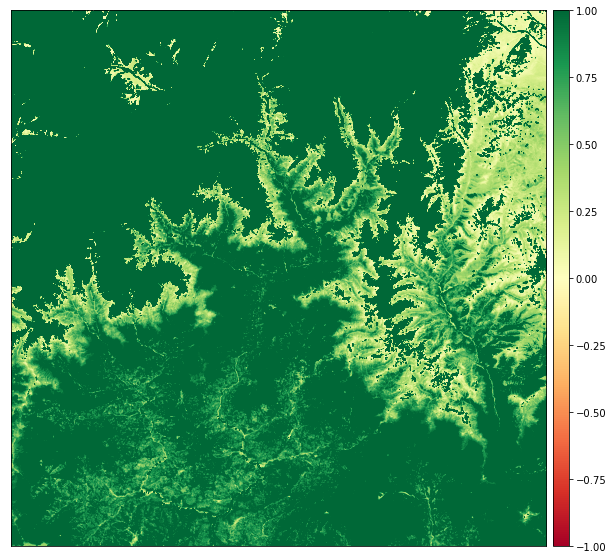

In [55]:
ep.plot_bands(
    arr = savi, cmap = "RdYlGn",
    cols = 1, vmin = -1, vmax = 1,
    # cols = 1, vmin = 0, vmax = 20851.73,
    figsize = (10, 14)
)

plt.show()

### Visible Atmospherically Resistant Index (VARI):

VARI is constructed to highlight vegetation in the visible spectrum while mitigating illumination differences and atmospheric effects. It is ideal for RGB or color images; it utilizes all three color bands.

$VARI = \frac{Green - Red}{Green + Red - Blue}$

Remember that, band 2 -> blue, band 3 -> green and band 4 -> red

In [57]:
vari = (stacked_s2_sentinel_img[2] - stacked_s2_sentinel_img[3]) / (stacked_s2_sentinel_img[2] + stacked_s2_sentinel_img[3] - stacked_s2_sentinel_img[1])

<ipython-input-57-46d98a9800ca>:1: RuntimeWarning: divide by zero encountered in true_divide
  vari = (stacked_s2_sentinel_img[2] - stacked_s2_sentinel_img[3]) / (stacked_s2_sentinel_img[2] + stacked_s2_sentinel_img[3] - stacked_s2_sentinel_img[1])
<ipython-input-57-46d98a9800ca>:1: RuntimeWarning: invalid value encountered in true_divide
  vari = (stacked_s2_sentinel_img[2] - stacked_s2_sentinel_img[3]) / (stacked_s2_sentinel_img[2] + stacked_s2_sentinel_img[3] - stacked_s2_sentinel_img[1])


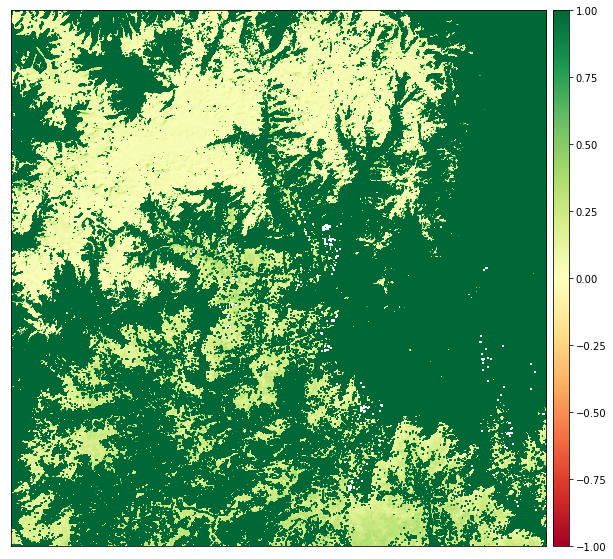

In [58]:
ep.plot_bands(
    arr = vari, cmap = "RdYlGn",
    cols = 1, vmin = -1, vmax = 1,
    figsize = (10, 14)
)

plt.show()

### Water Indices:

Remote sensing satellites such as Sentinel-2, etc. have consistently provided data which are helpful for extracting different types of land cover such as forest and water. Amongst the various proposed surface water extraction techniques, index-based methods are favored due to their simplicity and computational ease.


### Modified Normalized Difference Water Index (MNDWI):

MDWI employs SWIR and Green bands for enhancing water features while diminishing built-up area features which are often correlated with open water in other indices.

$MNDWI = \frac{Greem - SWIR}{Green + SWIR}$

In [60]:
mndwi = es.normalized_diff(stacked_s2_sentinel_img[2], stacked_s2_sentinel_img[8])

In [61]:
mndwi.min(), mndwi.max()

(0.0, 1365.2916666666667)

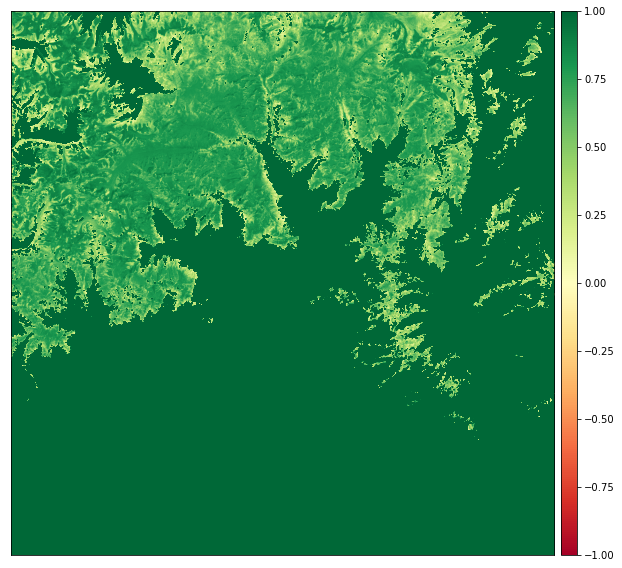

In [62]:
ep.plot_bands(
    arr = mndwi, cmap = "RdYlGn",
    cols = 1, vmin = -1, vmax = 1,
    figsize = (12, 10)
)

plt.show()

### Normalized Difference Moisture Index (NDMI):

NDMI is susceptible to the moisture contents in vegetation. NDMI is employed to keep and eye on droughts while also monitoring fuel levels in fire prone regions. It uses NIR and SWIR bands to create a ratio designed to mitigate illumination and atmospheric effects.

$NDMI = \frac{NIR - SWIR1}{NIR + SWIR1}$

In [66]:
ndmi = es.normalized_diff(stacked_s2_sentinel_img[10], stacked_s2_sentinel_img[9])

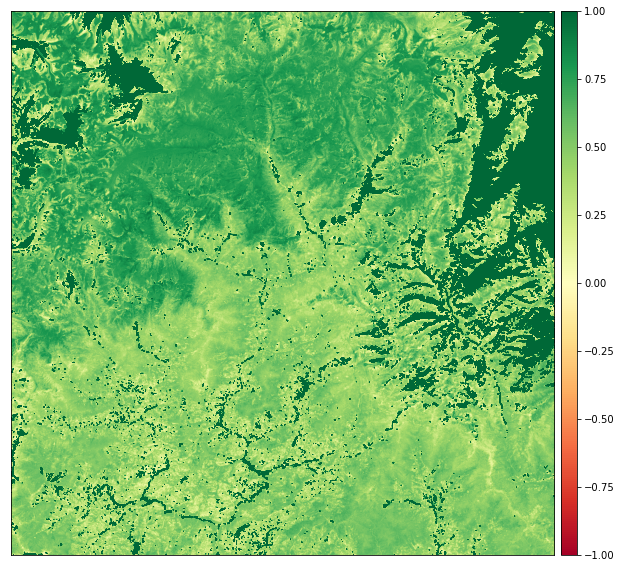

In [67]:
ep.plot_bands(
    arr = ndmi, cmap = "RdYlGn",
    cols = 1, vmin = -1, vmax = 1,
    figsize = (12, 10)
)

plt.show()

### Geology Indices:

Remote sensing can also be used for mineral exploration. It can be used to geolocate populated areas, roads, tracks, etc.


### Clay Minerals:

The clay ratio is a ratio of the SWIR1 and SWIR2 bands. This ratio uses the fact that hydrous minerals such as clays, alunite absorb radiation in the 2.0 to 2.3 micron portion of the spectrum. This index mitigates illumination changes due to terrain since it is a ratio.

$Clay\, Minerals\, Ratio = \frac{SWIR1}{SWIR2}$

In [70]:
cmr = np.divide(stacked_s2_sentinel_img[8], stacked_s2_sentinel_img[9])

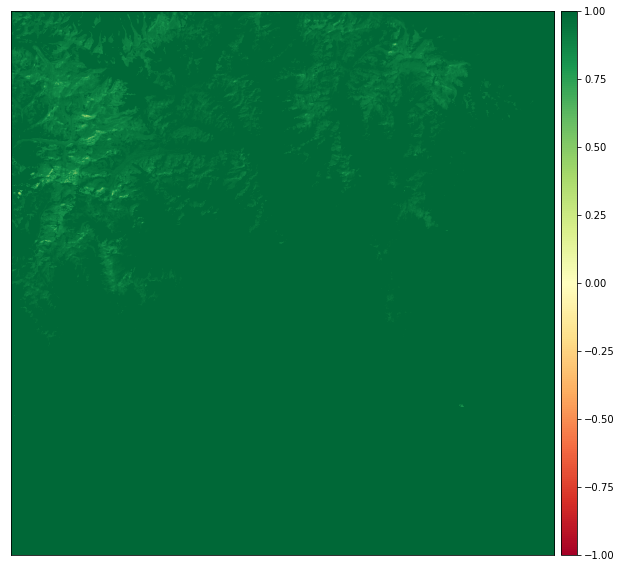

In [71]:
ep.plot_bands(
    arr = cmr, cmap = "RdYlGn",
    cols = 1, vmin = -1, vmax = 1,
    figsize = (12, 10)
)

plt.show()

### Ferrous Minerals:

The ferrous minerals ratio highlights iron-bearing materials. It uses the ratio between the SWIR band and the NIR band.

$Ferrous\, Minerals\, Ratio = \frac{SWIR}{NIR}$

In [72]:
s2_sentinel_bands

['T45RXL_20210208T043939_B01_60m.jp2',
 'T45RXL_20210208T043939_B02_60m.jp2',
 'T45RXL_20210208T043939_B03_60m.jp2',
 'T45RXL_20210208T043939_B04_60m.jp2',
 'T45RXL_20210208T043939_B05_60m.jp2',
 'T45RXL_20210208T043939_B06_60m.jp2',
 'T45RXL_20210208T043939_B07_60m.jp2',
 'T45RXL_20210208T043939_B09_60m.jp2',
 'T45RXL_20210208T043939_B11_60m.jp2',
 'T45RXL_20210208T043939_B12_60m.jp2',
 'T45RXL_20210208T043939_B8A_60m.jp2']

In [73]:
fmr = np.divide(stacked_s2_sentinel_img[8], stacked_s2_sentinel_img[10])

<ipython-input-73-c67f2db9dbfe>:1: RuntimeWarning: divide by zero encountered in true_divide
  fmr = np.divide(stacked_s2_sentinel_img[8], stacked_s2_sentinel_img[10])


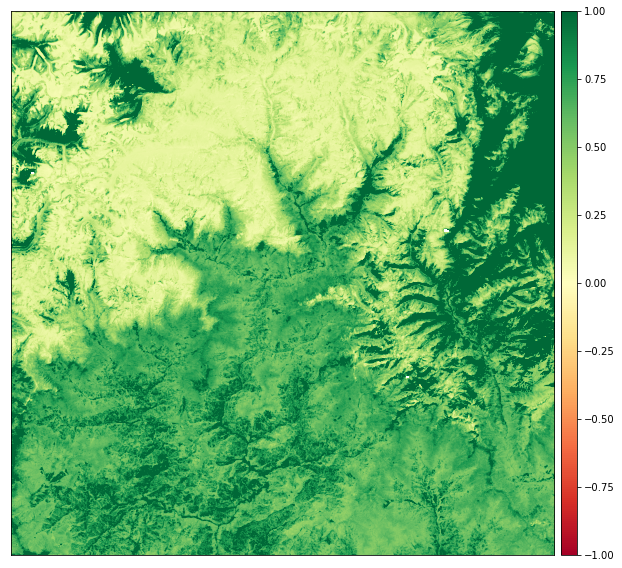

In [74]:
ep.plot_bands(
    arr = fmr, cmap = "RdYlGn",
    cols = 1, vmin = -1, vmax = 1,
    figsize = (12, 10)
)

plt.show()